# Importing Dependencies

In [1]:
import warnings
warnings.filterwarnings('ignore')
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Importing Preprocessing input functions for different pretrained models

from tensorflow.keras.applications.xception import preprocess_input as preprocess_input_xception
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input as preprocess_input_mobilenetv3
from tensorflow.keras.applications.resnet50  import preprocess_input as preprocess_input_resnet50


2025-04-08 14:39:51.999186: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-08 14:39:52.017409: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744115992.039466  199222 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744115992.045744  199222 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1744115992.061002  199222 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

# GPU Config

In [2]:
# Checking For GPU 
gpus = tf.config.list_physical_devices('GPU')


print('Using:')
print('\t\u2022 TensorFlow version:', tf.__version__)
print('\t\u2022 Running on GPU' if gpus else '\t\u2022 GPU device not found. Running on CPU')
physical_devices = tf.config.list_physical_devices('GPU')
for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)

Using:
	• TensorFlow version: 2.19.0
	• Running on GPU


# Data Collection

In [3]:
def load_data():
    """
    Load and prepare the TF Flowers dataset .
    
    Args:
        img_size: Target image size (height, width). Default is (224, 224).
        
    Returns:
        test_set, train_labels: Training set (images and labels)
        valid_set, valid_labels: Validation set (images and labels)
        train_set, test_labels: Test set (images and labels)
        class_names: List of class names
        info  : Information & Description of Dataset
    """
    # Define the splits
    splits = ["train[:10%]", "train[10%:25%]", "train[25%:]"]
    
    # Load the dataset
    (test_set, valid_set, train_set), info = tfds.load(
        "tf_flowers", split=splits, as_supervised=True, with_info=True
    )
    
    # Get class names
    class_names = info.features["label"].names
    
    return (test_set ,valid_set, train_set) ,class_names,info


# Data Exploration

In [4]:

def data_exploration(info):
    """
    Exploring the dataset with details such as features , dataset size , splits , etc..
    Args : 
            info : An Object that contains all dataset information extracted from tf.dataset
    Returns :
        image_shape : Shape of images in the dataset
        num_classes : Number of classes in the dataset
        labels : Labels of each class extracted from info object

    """
    # Extracting shape , number of classes and labels
    image_shape = info.features['image'].shape
    num_classes = info.features['label'].num_classes
    labels = info.features['label'].names

    # Train size before splitting into validation and training set
    train_val_size = info.splits['train'].num_examples

    # Defining sizes for each set
    test_size = int(train_val_size * 0.1) 
    val_size = int(train_val_size * 0.15)
    train_size = train_val_size - (test_size + val_size) 
    # Whole Size of Dataset
    dataset_size = train_size + val_size + test_size

    # Printing
    print("train size",train_size)
    print("validation size",val_size)
    print("test size",test_size)
    print("dataset total size : ",dataset_size)

    print("image shape : ",image_shape)
    print("dataset num of classes : ",num_classes)
    print("dataset labels : ", labels) 
    
    return image_shape,num_classes,labels



# Model Building

In [5]:
def build_transfer_model(input_shape, n_classes,pretrained_model=tf.keras.applications.Xception):
    """
    Build a model based on pretrained model architecture.
    Initially freezes pretrained layers.
    
    Args:
        input_shape: Input image shape (height, width, channels)
        n_classes: Number of output classes
        
    Returns:
        Compiled Keras model ready for training
    """
    # Load Pretrained model pretrained on ImageNet without the classification head
    base_model = pretrained_model(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape
    )
    
    # Freeze the base model first
    base_model.trainable = False
    
    # Create the inputs and apply the base model
    inputs = tf.keras.Input(shape=input_shape)
    x = base_model(inputs, training=False)
    
    # Add global average pooling and dense classification layer
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    
    # Add a dropout layer to prevent overfitting
    x = tf.keras.layers.Dropout(0.2)(x)
    
    # Add final dense layer with softmax
    outputs = tf.keras.layers.Dense(n_classes, activation="softmax")(x)
    
    # Create the full model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    
    # Check trainable status
    print(f"Total layers in model: {len(model.layers)}")
    print(f"Base model trainable: {base_model.trainable}")
    print(f"Trainable weights: {len(model.trainable_weights)}")
    print(f"Non-trainable weights: {len(model.non_trainable_weights)}")
    
    return model



# Creating Pipeline


In [6]:
def construct_pipeline(train_set, val_set, test_set, preprocessing_method, batch_size=64):
    """
    Constructs optimized data pipelines for training
    
    Args:
        train_set: TF Dataset for training
        val_set: TF Dataset for validation
        test_set: TF Dataset for testing
        preprocessing_method: Preprocessing function for images
        batch_size: Batch size (default 64)
    
    Returns:
        Tuple of (train_batches, val_batches, test_batches)
    """
    # Normalizng Image function for each pretrained model given it's preprocessing method
    def unified_preprocess(image, label):
        
        image = tf.image.resize(image, [224, 224])
                
         
        image =preprocessing_method(image)  # preprocess_input_resnet50/xception/etc
                
        return image, label

    # Calculate dataset sizes
    train_examples_size = len(list(train_set))  # Convert to list to get exact length
    
    # Improved preprocessing function that preserves labels
    def preprocess_with_labels(image, label):
        return preprocessing_method(image), label
    
    # Construct pipelines
    
    train_batches = (
        train_set
        .shuffle(buffer_size=train_examples_size//4)
        .map(unified_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE)
    )
    
    val_batches = (
        val_set
        .map(unified_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE)
    )
    
    test_batches = (
        test_set
        .map(unified_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE)
    )
    
    return train_batches, val_batches, test_batches

# Model Compiling & Training 

In [7]:

def compile_and_train_model(model, train_batches,val_batches ,epochs=1, lr=0.1):
    """
    Compile and train the model with initial frozen layers using NumPy arrays.
    
    Args:
        model: Keras model to train
        train_batches : training samples
        val_batches : validation batches
        epochs: Number of epochs to train (default is 3)
        lr: Learning rate (default is 0.1)
        
    Returns:
        Training history
    """
    print("\n--- Phase 1: Training with frozen base model ---")
    
    # Use SGD optimizer with momentum for initial training or some other optimizer
    optimizer = tf.keras.optimizers.SGD(learning_rate=lr, momentum=0.9)
    
    # Showing the model architicture
    tf.keras.utils.plot_model(model, show_shapes=True)

    # Compile the model
    model.compile(
        loss="sparse_categorical_crossentropy",
        optimizer=optimizer,
        metrics=["accuracy"]
    )

    model.summary()
    # Train the model using NumPy arrays
    history = model.fit(
        train_batches,
        validation_data=val_batches,
        epochs=epochs,
        callbacks=[tf.keras.callbacks.EarlyStopping(patience=2, restore_best_weights=True)]
    )

    return history

# Fine Tuning Model

In [8]:
def fine_tune_model_by_blocks(model, train_batches, 
                            val_batches, 
                            blocks_to_unfreeze=2, lr=0.01, epochs=5):
    """
    Unfreeze layers by complete blocks, starting from the last block.
    
    Args:
        blocks_to_unfreeze: Number of blocks to unfreeze (starting from the end)
    """
    print("\n--- Phase 2: Fine-tuning with partially unfrozen base model (By Blocks) ---")
    

    
    # Get the base model
    base_model = None
    for layer in model.layers:
        if isinstance(layer, tf.keras.Model):
            base_model = layer
            break
    
    if base_model is None:
        raise ValueError("Base model not found in the provided model.")
    

    # Freezing Baseline Model
    base_model.trainable = False
    # Identify blocks by name - more robust version
    block_layers = {}
    for layer in base_model.layers:
        # Skip layers not in blocks (like conv1, bn_conv1, etc.)
        if not ('block' in layer.name or 'conv' in layer.name or 'bn_' in layer.name):
            continue
            
        # Try to extract block number
        block_num = None
        parts = layer.name.split('_')
        
        # Case 1: Standard block naming (blockX_...)
        if parts[0].startswith('block'):
            try:
                block_num = int(parts[0].replace('block', ''))
            except:
                continue
                
        # Case 2: Convolutional layers before blocks (conv1, conv2)
        elif parts[0].startswith('conv'):
            try:
                block_num = 0  # Treat pre-block conv layers as block 0
            except:
                continue
                
        # Case 3: Batch norm layers (bn_conv1, etc.)
        elif parts[0].startswith('bn'):
            try:
                if parts[1].startswith('conv'):
                    block_num = 0  # Treat pre-block batch norm as block 0
            except:
                continue
                
        if block_num is not None:
            if block_num not in block_layers:
                block_layers[block_num] = []
            block_layers[block_num].append(layer)
    
    if not block_layers:
        raise ValueError("No blocks found in the base model. Check layer naming conventions.")
    
    # Sort blocks by number (highest first for unfreezing from the end)
    sorted_blocks = sorted(block_layers.keys(), reverse=True)
    
    print(f"Found blocks: {sorted_blocks}")
    
    # Unfreeze the specified number of blocks from the end
    for block_num in sorted_blocks[:blocks_to_unfreeze]:
        print(f"Unfreezing block {block_num} with {len(block_layers[block_num])} layers")
        for layer in block_layers[block_num]:
            layer.trainable = True
                
    # Ensure top/classification layers are trainable
    for layer in model.layers[-2:]:  # Usually the last 2 layers are classification layers
        layer.trainable = True
    
    # Recompile the model with a lower learning rate
    optimizer = tf.keras.optimizers.SGD(learning_rate=lr, momentum=0.9)

    # Showing the model architicture
    tf.keras.utils.plot_model(model, show_shapes=True)

    model.compile(
        loss="sparse_categorical_crossentropy",
        optimizer=optimizer,
        metrics=["accuracy"]
    )

    
    model.summary()
    # Print trainable layers
    trainable_layers = [layer.name for layer in model.layers if layer.trainable] + \
                      [layer.name for layer in base_model.layers if layer.trainable]
    
    print(f"Trainable layers: {trainable_layers}")
    print(f"Total trainable layers: {len(trainable_layers)}")
    


    # Train the model
    history = model.fit(
        train_batches,
        validation_data=val_batches,
        epochs=epochs,
        callbacks=[tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)]
    )

    
    return history

def fine_tune_model(model,train_batches, val_batches, 
                    unfreeze_from_layer=56, lr=0.01, epochs=5):
    """
    Unfreeze layers from the given layer number and fine-tune the model.
    
    Args:
        model: Keras model to fine-tune
        train_batches: training samples
        val_batches : validation batches
        unfreeze_from_layer: Layer index to start unfreezing from (default is 56)
        lr: Learning rate (default is 0.01)
        epochs: Number of epochs for fine-tuning (default is 10)
        
    Returns:
        Training history
    """
    print("\n--- Phase 2: Fine-tuning with partially unfrozen base model (By Layers Number) ---")
    
    # Unfreeze layers from the specified index to the end of the base model layers
    # The base model layers are the layers with names starting with 'block'
    base_model_layers = [layer for layer in model.layers if layer.name.startswith('block')]
    
    # Identify the index of the first layer to unfreeze
    if unfreeze_from_layer < len(base_model_layers):
        for layer in base_model_layers[unfreeze_from_layer:]:
            layer.trainable = True
    
    # Ensure top layers are trainable
    model.layers[-2].trainable = True  # Global Average Pooling
    model.layers[-1].trainable = True  # Dense layer
    
    # Recompile the model with a lower learning rate
    optimizer = tf.keras.optimizers.SGD(learning_rate=lr, momentum=0.9)

    # Showing the model architicture
    tf.keras.utils.plot_model(model, show_shapes=True)

    model.compile(
        loss="sparse_categorical_crossentropy",
        optimizer=optimizer,
        metrics=["accuracy"]
    )
    model.summary()
    
    # Print trainable layers
    trainable_layers = [layer.name for layer in model.layers if layer.trainable]
    print(f"Trainable layers: {trainable_layers}")
    print(f"Total trainable layers: {len(trainable_layers)}")
    
    # Train the model
    history = model.fit(
        train_batches,
        validation_data=val_batches,
        epochs=epochs,
        callbacks=[tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)]
    )
    
    return history

# Model Evaluation

In [9]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def evaluate_model(model, test_batches, class_names, preprocessing_type):
    """
    Evaluate the trained model on the test dataset and visualize predictions.

    Args:
        model: Trained Keras model
        test_batches: tf.data.Dataset of test data
        class_names: List of class names
        preprocessing_type: Type of preprocessing used ('resnet50', 'xception', 'mobilenet', etc.)

    Returns:
        Tuple of (loss, accuracy)
    """
    print("\n--- Evaluating model on test set ---")

    # Evaluate directly on the dataset
    loss, accuracy = model.evaluate(test_batches, verbose=0)
    print(f"Test Loss: {loss:.4f}")
    print(f"Test Accuracy: {accuracy:.2%}")

    # Collect all test images and labels
    test_images = []
    test_labels = []

    for images, labels in test_batches:
        test_images.append(images.numpy())
        test_labels.append(labels.numpy())

    test_images = np.concatenate(test_images, axis=0)
    test_labels = np.concatenate(test_labels, axis=0)

    # Get predictions
    predictions = model.predict(test_images)
    pred_classes = np.argmax(predictions, axis=1)

    # Classification report
    print("\nClassification Report:")
    print(classification_report(test_labels, pred_classes, target_names=class_names))

    # Show example predictions
    plt.figure(figsize=(15, 15))
    n_examples = min(9, len(test_images))

    for i in range(n_examples):
        plt.subplot(3, 3, i + 1)
        img = test_images[i].copy()

        # Reverse preprocessing
        if preprocessing_type == 'xception':
            img = (img * 0.5 + 0.5) * 255
        elif preprocessing_type == 'resnet50':
            img += [103.939, 116.779, 123.68]
            img = img[..., ::-1]  # BGR to RGB
        elif preprocessing_type == 'mobilenet':
            img = (img + 1.0) * 127.5

        img = np.clip(img, 0, 255).astype("uint8")
        plt.imshow(img)
        color = 'green' if test_labels[i] == pred_classes[i] else 'red'
        plt.title(f"True: {class_names[test_labels[i]]}\nPred: {class_names[pred_classes[i]]}", color=color)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Confusion Matrix
    cm = confusion_matrix(test_labels, pred_classes)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    return loss, accuracy


# Plotting Learning Curves

In [10]:
def plot_learning_curves(history1, history2):
    """
    Plot learning curves from both training phases.
    
    Args:
        history1: History from initial training
        history2: History from fine-tuning
    """
    plt.figure(figsize=(12, 4))
    
    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history1.history['accuracy'], label='Training (Phase 1)')
    plt.plot(history1.history['val_accuracy'], label='Validation (Phase 1)')
    
    # Adjust for phase 2 (continue the graph)
    offset = len(history1.history['accuracy'])
    plt.plot(np.arange(offset, offset + len(history2.history['accuracy'])), 
             history2.history['accuracy'], label='Training (Phase 2)')
    plt.plot(np.arange(offset, offset + len(history2.history['val_accuracy'])), 
             history2.history['val_accuracy'], label='Validation (Phase 2)')
    
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history1.history['loss'], label='Training (Phase 1)')
    plt.plot(history1.history['val_loss'], label='Validation (Phase 1)')
    
    # Adjust for phase 2
    plt.plot(np.arange(offset, offset + len(history2.history['loss'])), 
             history2.history['loss'], label='Training (Phase 2)')
    plt.plot(np.arange(offset, offset + len(history2.history['val_loss'])), 
             history2.history['val_loss'], label='Validation (Phase 2)')
    
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


# Displaying Examples

In [11]:
import matplotlib.pyplot as plt
import numpy as np

def display_examples(samples, class_names, n=9):
    """
    Display example images from a batch of samples (images, labels).

    Args:
        samples: Tuple (images, labels)
        class_names: List of class names
        n: Number of examples to show (default is 9)
        preprocessing_type: Type of preprocessing applied
    """
    images, labels = samples
    plt.figure(figsize=(12, 12))

    for i in range(n):
        img = images[i].numpy().copy()
   
        label = labels[i].numpy()


        plt.subplot(3, 3, i + 1)

       


        plt.imshow(img.astype("uint8"))
        plt.title(f"Class: {class_names[label]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


# Main Function

=== Transfer Learning with TensorFlow and MobileNetV3 ===


I0000 00:00:1744116001.688859  199222 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3586 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6


train size 2753
validation size 550
test size 367
dataset total size :  3670
image shape :  (None, None, 3)
dataset num of classes :  5
dataset labels :  ['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']


2025-04-08 14:40:01.992508: I tensorflow/core/kernels/data/tf_record_dataset_op.cc:387] The default buffer size is 262144, which is overridden by the user specified `buffer_size` of 8388608
2025-04-08 14:40:03.026700: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Displaying example images from the training set:


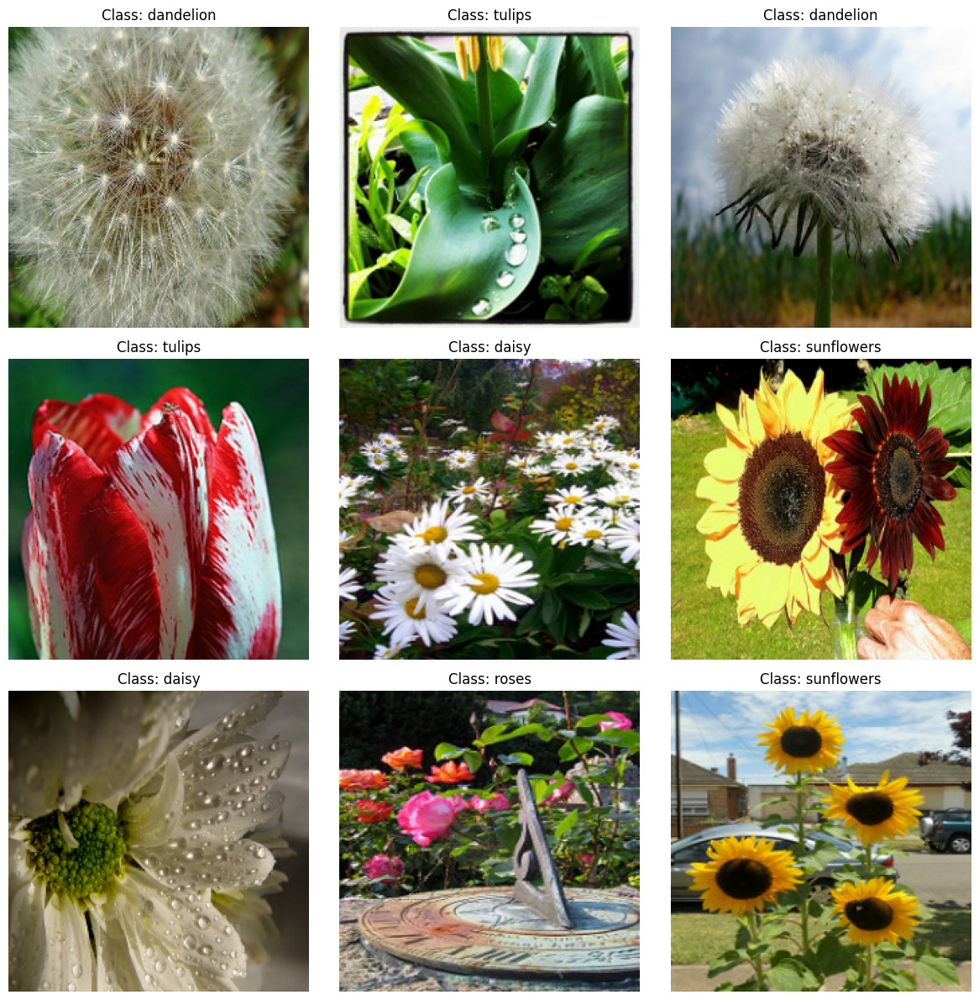

Total layers in model: 5
Base model trainable: False
Trainable weights: 2
Non-trainable weights: 262

--- Phase 1: Training with frozen base model ---


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNetV3Large (Functional)   │ (None, 7, 7, 960)      │     2,996,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 960)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 960)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 5)              │         4,805 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,001,157 (11.45 MB)

 Trainable params: 4,805 (18.77 KB)

 Non-trainable params: 2,996,352 (11.43 MB)

I0000 00:00:1744116015.338919  199317 service.cc:152] XLA service 0x7f5c40003d00 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1744116015.338977  199317 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2025-04-08 14:40:16.041301: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1744116019.035976  199317 cuda_dnn.cc:529] Loaded cuDNN version 90600


 2/86 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - accuracy: 0.2109 - loss: 2.6685  

I0000 00:00:1744116031.113232  199317 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


85/86 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.6996 - loss: 3.1093

2025-04-08 14:40:36.996027: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1539', 104 bytes spill stores, 104 bytes spill loads

2025-04-08 14:40:37.232386: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1539', 304 bytes spill stores, 304 bytes spill loads

2025-04-08 14:40:37.257752: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1539', 104 bytes spill stores, 104 bytes spill loads

2025-04-08 14:40:37.749401: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1539', 2144 bytes spill stores, 2148 bytes spill loads

2025-04-08 14:40:37.414506: I 

86/86 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - accuracy: 0.7018 - loss: 3.1001 - val_accuracy: 0.8675 - val_loss: 2.0599

--- Evaluating model on test set ---


2025-04-08 14:40:53.289923: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1539', 168 bytes spill stores, 168 bytes spill loads

2025-04-08 14:40:53.566716: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1539', 168 bytes spill stores, 168 bytes spill loads

2025-04-08 14:40:54.108130: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1539', 2124 bytes spill stores, 2124 bytes spill loads



Test Loss: 1.5887
Test Accuracy: 89.37%


2025-04-08 14:41:02.010256: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 446ms/step

Classification Report:
              precision    recall  f1-score   support

   dandelion       1.00      0.85      0.92       106
       daisy       0.70      0.98      0.82        58
      tulips       0.88      0.90      0.89        70
  sunflowers       0.95      0.94      0.94        63
       roses       0.95      0.84      0.89        70

    accuracy                           0.89       367
   macro avg       0.90      0.90      0.89       367
weighted avg       0.91      0.89      0.90       367



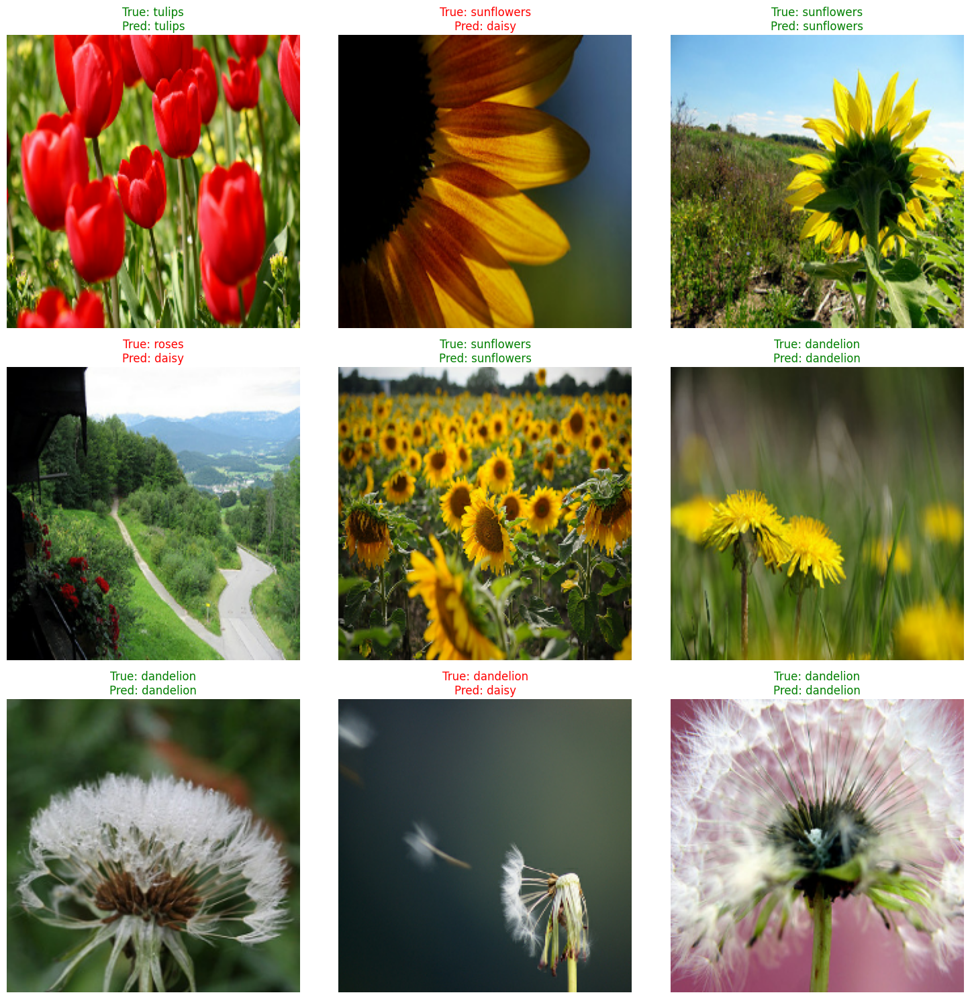

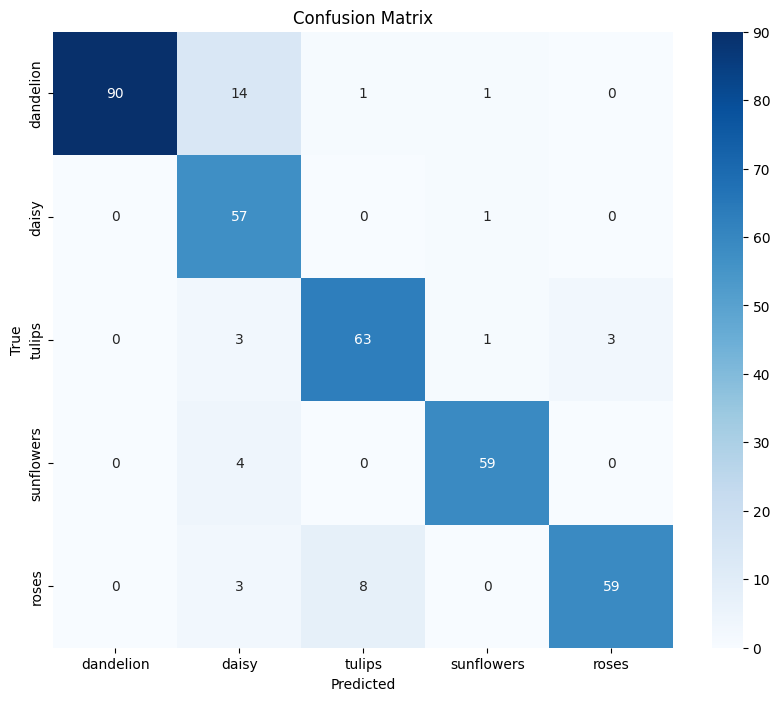


--- Phase 2: Fine-tuning with partially unfrozen base model (By Blocks) ---
Found blocks: [0]
Unfreezing block 0 with 4 layers


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ keras_tensor_203 (InputLayer)   │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNetV3Large (Functional)   │ (None, 7, 7, 960)      │     2,996,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 960)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 960)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 5)              │         4,805 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,001,157 (11.45 MB)

 Trainable params: 160,789 (628.08 KB)

 Non-trainable params: 2,840,368 (10.84 MB)

Trainable layers: ['keras_tensor_203', 'global_average_pooling2d', 'dropout', 'dense', 'input_layer', 'conv', 'conv_bn', 'conv_1', 'conv_1_bn']
Total trainable layers: 9
Epoch 1/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - accuracy: 0.8683 - loss: 1.3588 - val_accuracy: 0.7641 - val_loss: 5.4287
Epoch 2/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - accuracy: 0.9135 - loss: 0.9068 - val_accuracy: 0.8330 - val_loss: 3.2582
Epoch 3/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - accuracy: 0.9629 - loss: 0.2708 - val_accuracy: 0.8566 - val_loss: 2.7346
Epoch 4/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - accuracy: 0.9696 - loss: 0.2166 - val_accuracy: 0.8693 - val_loss: 2.3568
Epoch 5/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.9826 - loss: 0.0875 - val_accuracy: 0.8875 - val_loss: 2.0683
Epoch 6/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.9837 - loss: 0.0811 - val_accuracy: 0.8984 - val_loss: 1.8239
Epoch 7/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - accuracy: 0.9

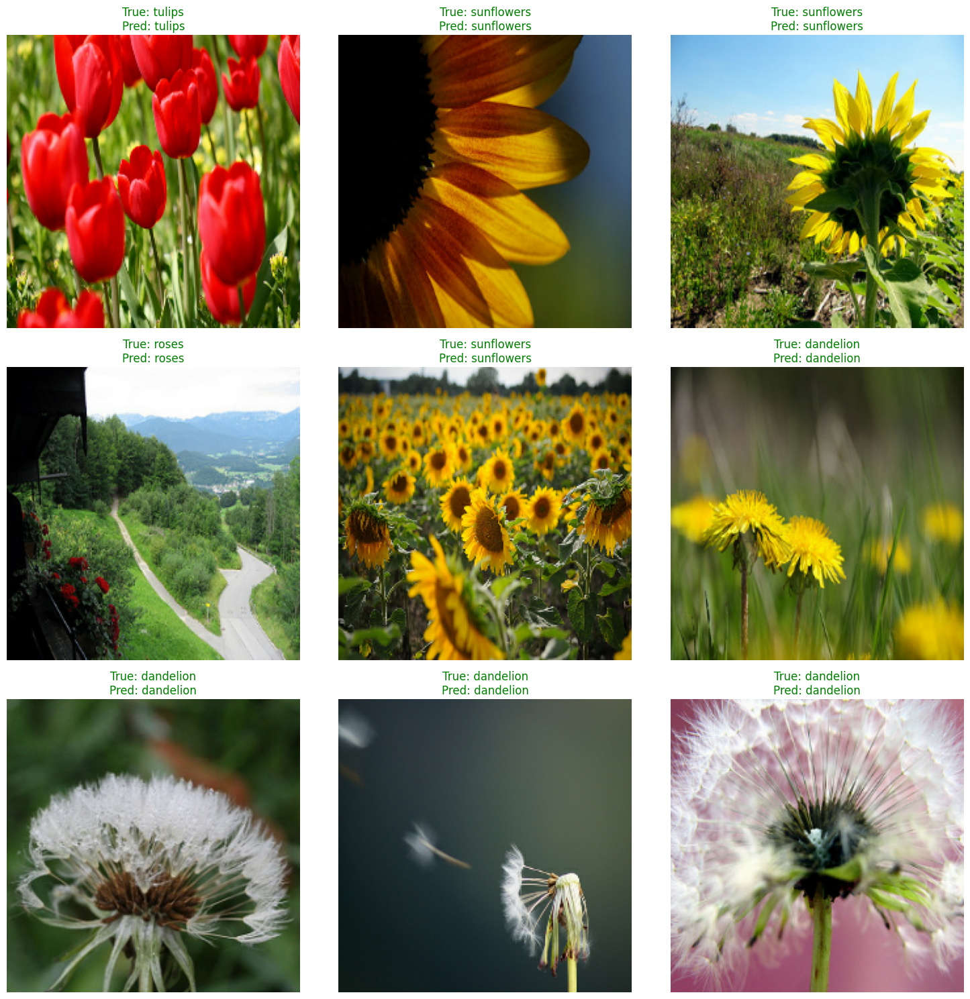

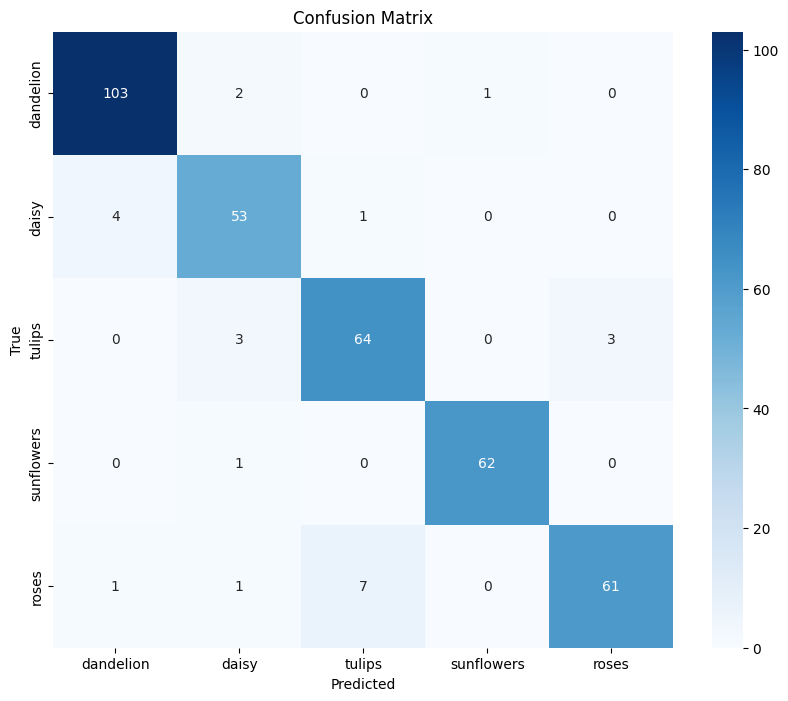


--- Phase 2: Fine-tuning with partially unfrozen base model (By Layers Number) ---


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ keras_tensor_203 (InputLayer)   │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNetV3Large (Functional)   │ (None, 7, 7, 960)      │     2,996,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 960)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 960)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 5)              │         4,805 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,001,157 (11.45 MB)

 Trainable params: 4,805 (18.77 KB)

 Non-trainable params: 2,996,352 (11.43 MB)

Trainable layers: ['keras_tensor_203', 'global_average_pooling2d', 'dropout', 'dense']
Total trainable layers: 4
Epoch 1/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - accuracy: 0.8957 - loss: 1.3839 - val_accuracy: 0.8984 - val_loss: 1.6651
Epoch 2/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - accuracy: 0.9218 - loss: 0.8712 - val_accuracy: 0.8929 - val_loss: 1.5635
Epoch 3/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - accuracy: 0.9232 - loss: 0.7069 - val_accuracy: 0.8984 - val_loss: 1.4419
Epoch 4/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.9268 - loss: 0.7299 - val_accuracy: 0.8966 - val_loss: 1.3689
Epoch 5/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - accuracy: 0.9334 - loss: 0.5447 - val_accuracy: 0.8947 - val_loss: 1.3323
Epoch 6/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - accuracy: 0.9301 - loss: 0.5635 - val_accuracy: 0.8984 - val_loss: 1.3746
Epoch 7/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - accuracy: 0.9424 - loss: 0.4255 - val_accuracy: 0.8984 - val_loss: 1.3

2025-04-08 14:43:39.240978: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 497ms/step

Classification Report:
              precision    recall  f1-score   support

   dandelion       0.94      0.96      0.95       106
       daisy       0.90      0.91      0.91        58
      tulips       0.89      0.84      0.87        70
  sunflowers       0.93      1.00      0.96        63
       roses       0.92      0.87      0.90        70

    accuracy                           0.92       367
   macro avg       0.92      0.92      0.92       367
weighted avg       0.92      0.92      0.92       367



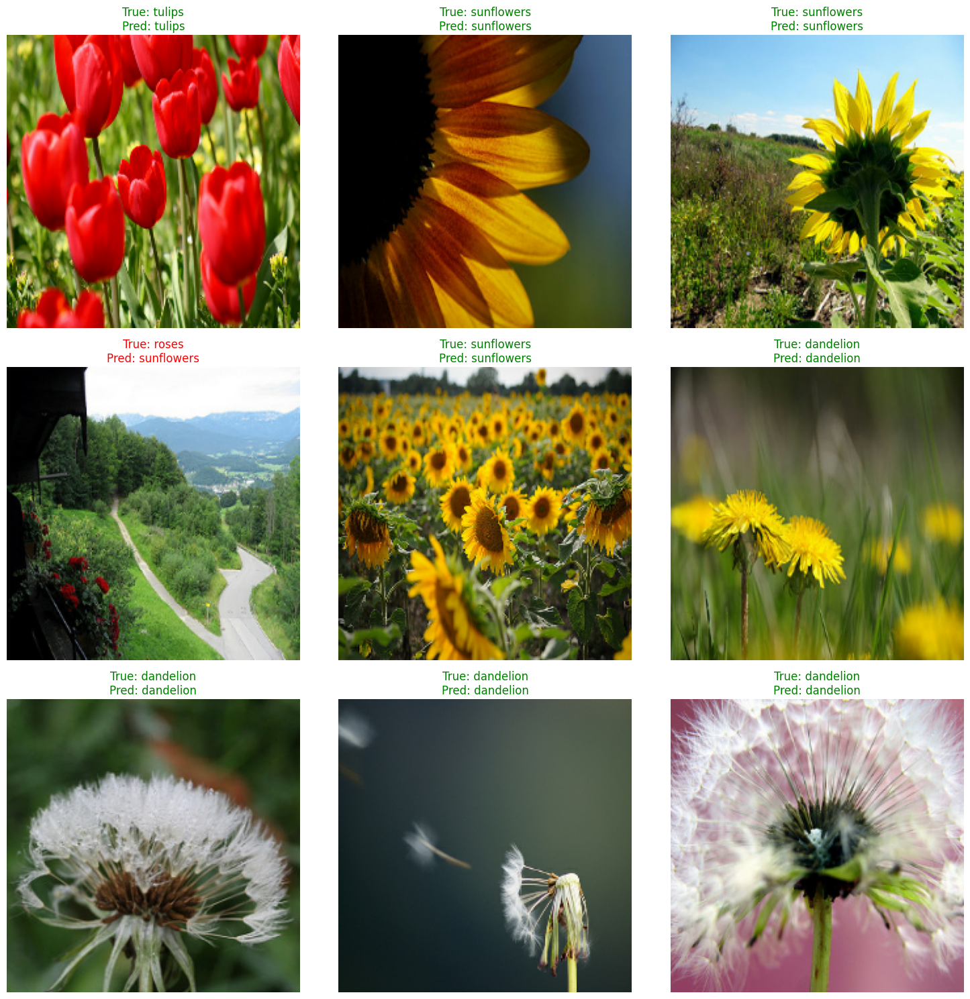

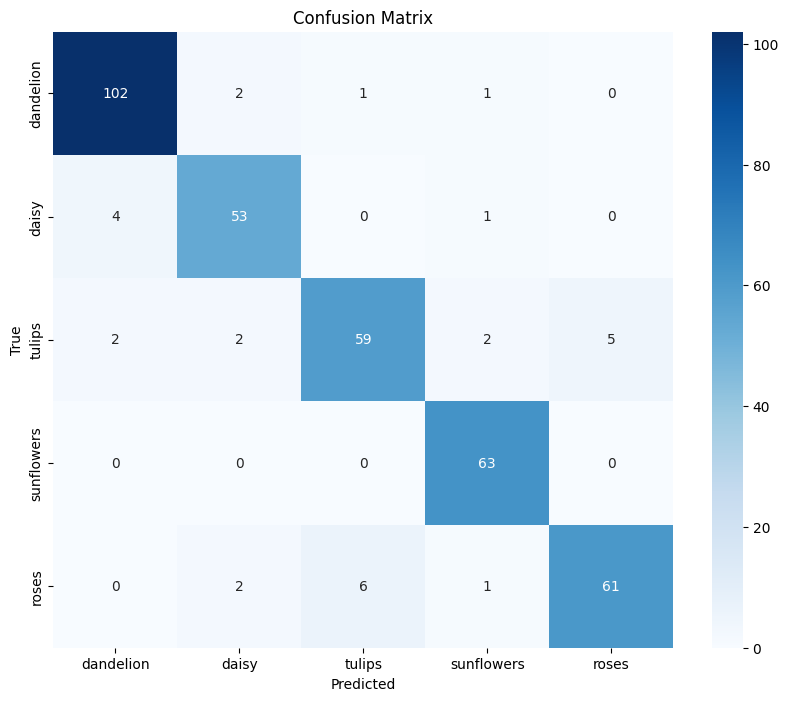

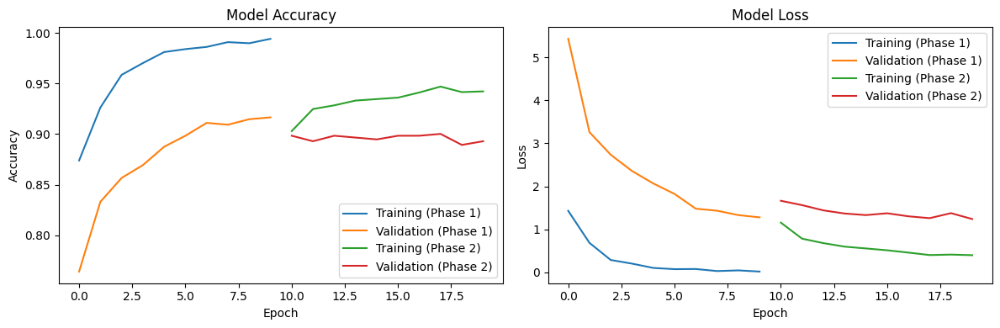


=== Transfer Learning Workflow Complete ===


In [12]:
def main():
    """
    Main function to run the complete transfer learning workflow.
    """
    # Declaring Pretrained models
    models = {
        "ResNet50": (preprocess_input_resnet50, tf.keras.applications.resnet50.ResNet50),
        "Xception": ( preprocess_input_xception, tf.keras.applications.xception.Xception),
        "MobileNetV3": (preprocess_input_mobilenetv3,tf.keras.applications.MobileNetV3Large),
    }
    
    model_key = 'MobileNetV3'
    selected_model = models[model_key]  

    # Freezing Hyper Paramaeters
    unfreeze_from_layer = 150
    blocks_to_unfreeze = 3


    
    # Set random seed for reproducibility
    np.random.seed(42)
    tf.random.set_seed(42)
    print(f"=== Transfer Learning with TensorFlow and {model_key} ===")
    
    # Load and split the dataset

    (test_set,val_set,train_set),class_names ,info= load_data()

    # Data Exploration
    data_exploration(info)

    # Constructing Model Pipeline
    (train_batches,val_batches,test_batches)= construct_pipeline(train_set=train_set,val_set=val_set,test_set=test_set ,preprocessing_method=selected_model[0], batch_size=32)
    # Display some examples
    print("\nDisplaying example images from the training set:")
    batch = next(iter(train_batches))
    display_examples(batch, class_names, 
                         n=9)
    
    # Build the transfer learning model
    model = build_transfer_model(input_shape=(224, 224, 3), 
                               n_classes=len(class_names),
                               pretrained_model=selected_model[1])
    
    # Phase 1: Train with frozen base model
 
    history1 = compile_and_train_model(model, 
                                       train_batches=train_batches,
                                       val_batches=val_batches,
                                     epochs=1, lr=0.1)
    evaluate_model(model,test_batches, 
                 class_names, selected_model[0])
    
    # Phase 2: Fine-tune by blocks


    model_for_block_tuning = tf.keras.models.clone_model(model)
    model_for_block_tuning.set_weights(model.get_weights())
    
    history2= fine_tune_model_by_blocks(model_for_block_tuning, 
                                       train_batches,
                                       val_batches,
                                       blocks_to_unfreeze=blocks_to_unfreeze, 
                                       lr=0.01, epochs=10)
    evaluate_model(model_for_block_tuning, test_batches,
                 class_names,preprocessing_type = model_key.lower())
    


    # Phase 3: Fine-tune with some layers unfrozen

    
   
    model_for_fine_tune = tf.keras.models.clone_model(model)
    model_for_fine_tune.set_weights(model.get_weights())
    
    history3 = fine_tune_model(model_for_fine_tune,
                                       train_batches,
                                       val_batches,
                             unfreeze_from_layer=unfreeze_from_layer, lr=0.01, epochs=10)
    evaluate_model(model_for_fine_tune, test_batches,
                 class_names,preprocessing_type = model_key.lower())

    
    # Plot learning curves
    plot_learning_curves(history2, history3)
    # plot_learning_curves(history1, history3)
    
    print("\n=== Transfer Learning Workflow Complete ===")

if __name__ == "__main__":
    main()